<a href="https://colab.research.google.com/github/ELSOUDY2030/ASDC/blob/main/Building_Count_huggingface.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Download the image file
!gdown --id 1oERidAVLe_EcABXmaNOhJIn0Hvyk_Uft

# Download pre-trained YOLOv8 models from Hugging Face for building segmentation and detection
# YOLOv8 small model for building segmentation by flkennedy
!gdown https://huggingface.co/flkennedy/YOLOv8s-building-segmentation-demo/resolve/main/best.pt -O buildingm-flkennedy.pt

# YOLOv8 model for building detection by Bruno64
!gdown https://huggingface.co/Bruno64/YOLOv8-building-detect/resolve/main/YOLOv8_20240124_bruno.pt -O bruno.pt

# YOLOv8 medium model fine-tuned on SpaceNetV2 for instance segmentation by odil111
!gdown https://huggingface.co/odil111/yolov8m-seg-fine-tuned-on-spacenetv2/resolve/main/yolov8m_inst_seg_2024-06-11--15-57-15/weights/best.pt -O spacenetv2.pt

# YOLOv8 nano model for building segmentation by keremberke
!gdown https://huggingface.co/keremberke/yolov8n-building-segmentation/resolve/main/best.pt -O buildingn-keremberke.pt

# YOLOv8 small model for building segmentation by keremberke
!gdown https://huggingface.co/keremberke/yolov8s-building-segmentation/resolve/main/best.pt -O buildings-keremberke.pt

# YOLOv8 medium model for building segmentation by keremberke
!gdown https://huggingface.co/keremberke/yolov8m-building-segmentation/resolve/main/best.pt -O buildingm-keremberke.pt


/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:132: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1oERidAVLe_EcABXmaNOhJIn0Hvyk_Uft
From (redirected): https://drive.google.com/uc?id=1oERidAVLe_EcABXmaNOhJIn0Hvyk_Uft&confirm=t&uuid=18d15b23-b0dc-4db8-92c8-12522f774427
To: /content/Untitled.jpg
100% 132M/132M [00:02<00:00, 46.3MB/s]
Downloading...
From: https://huggingface.co/flkennedy/YOLOv8s-building-segmentation-demo/resolve/main/best.pt
To: /content/buildingm-flkennedy.pt
100% 23.8M/23.8M [00:00<00:00, 70.1MB/s]
Downloading...
From: https://huggingface.co/Bruno64/YOLOv8-building-detect/resolve/main/YOLOv8_20240124_bruno.pt
To: /content/bruno.pt
100% 54.8M/54.8M [00:00<00:00, 78.6MB/s]
Downloading...
From: https://huggingface.co/odil111/yolov8m-seg-fine-tuned-on-spacenetv2/resolve/main/yolov8m_inst_seg

In [2]:
# Install the Ultralytics package, which includes the YOLOv8 model implementation and utilities
!pip install ultralytics

# Install the Inference SDK, a toolkit for deploying machine learning models
!pip install inference_sdk

# Upgrade and install SAHI (Slicing Aided Hyper Inference), a tool to optimize inference for large images
!pip install -U sahi

# Install the Roboflow package, which provides tools for dataset management and model deployment
!pip install roboflow


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 2.4 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.

In [4]:
import cv2
import matplotlib.pyplot as plt
from sahi import AutoDetectionModel
from sahi.predict import get_sliced_prediction
import numpy as np

# Evaluating the medium model fine-tuned on SpaceNetV2 for instance segmentation by odil111

Performing prediction on 1610 slices.
Number of buildings detected: (1258)


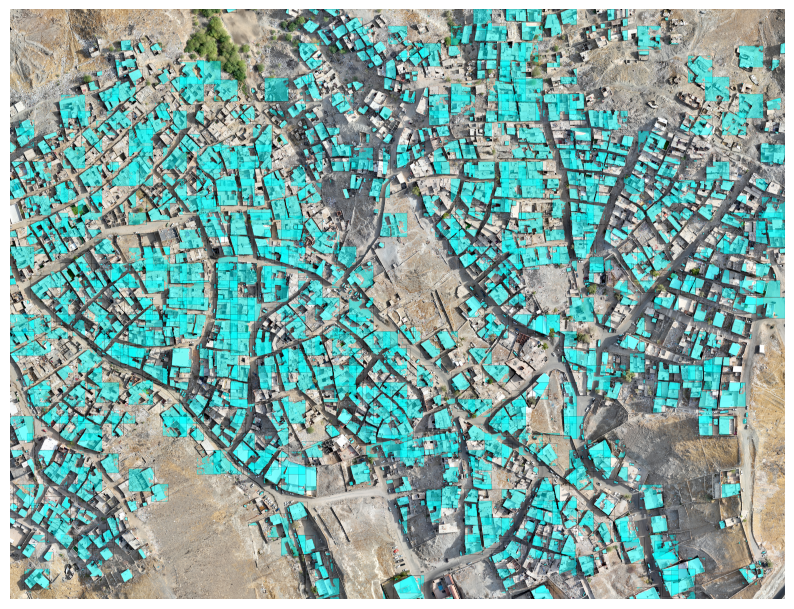

In [ ]:
# # Read the original image
image = cv2.imread("Untitled.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# # Load the auto-detection model
detection_model = AutoDetectionModel.from_pretrained(
    model_type="yolov8",
    model_path='spacenetv2.pt',
    confidence_threshold=0.3,
    device="cuda:0"  # or 'cpu'
)

# Perform prediction
result = get_sliced_prediction(
    image,
    detection_model,
    slice_height=400,
    slice_width=400,
    overlap_height_ratio=0.3,
    overlap_width_ratio=0.3,
    postprocess_class_agnostic=True
)



# Check if any predictions are made
if not result.object_prediction_list:
    print("No objects detected in the image.")
else:
    building_count = 0
    # Draw bounding boxes and masks on the image
    for x, object_prediction in enumerate(result.object_prediction_list):
      if object_prediction.score.value < 0.45:
        continue

        # Draw bounding box
      building_count += 1
      cv2.rectangle(
          image,
          (object_prediction.bbox.minx, object_prediction.bbox.miny),
          (object_prediction.bbox.maxx, object_prediction.bbox.maxy),
          (0, 0, 0), 2
      )
        # Apply mask if available
      if hasattr(object_prediction, 'mask') and object_prediction.mask is not None:
          mask = object_prediction.mask.bool_mask
          # Ensure the mask is a boolean array
          if mask.dtype != bool:
              mask = mask.astype(bool)
          # Highlight the mask on the image
          image[mask] = (image[mask] * 0.5 + np.array([0, 255, 255]) * 0.5).astype(np.uint8)

# Display the image
print(f"Number of buildings detected: ({building_count})")
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis('off')
plt.show()


# Evaluating the nano model for building segmentation by keremberke

Performing prediction on 42 slices.
Number of buildings detected: (606)


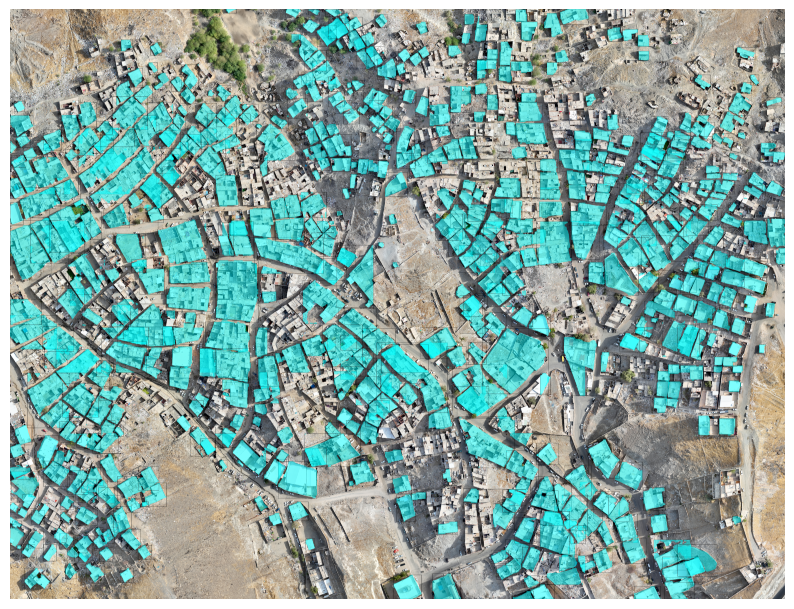

In [ ]:
# # Read the original image
image = cv2.imread("Untitled.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# # Load the auto-detection model
detection_model = AutoDetectionModel.from_pretrained(
    model_type="yolov8",
    model_path='buildingn-flkennedy.pt',
    confidence_threshold=0.3,
    device="cuda:0"  # or 'cpu'
)

# Perform prediction
result = get_sliced_prediction(
    image,
    detection_model,
    slice_height=2500,
    slice_width=2500,
    overlap_height_ratio=0.3,
    overlap_width_ratio=0.3,
    postprocess_class_agnostic=True
)



# Check if any predictions are made
if not result.object_prediction_list:
    print("No objects detected in the image.")
else:
    building_count = 0
    # Draw bounding boxes and masks on the image
    for x, object_prediction in enumerate(result.object_prediction_list):
      if object_prediction.score.value < 0.4:
        continue

        # Draw bounding box
      building_count += 1
      cv2.rectangle(
          image,
          (object_prediction.bbox.minx, object_prediction.bbox.miny),
          (object_prediction.bbox.maxx, object_prediction.bbox.maxy),
          (0, 0, 0), 2
      )
        # Apply mask if available
      if hasattr(object_prediction, 'mask') and object_prediction.mask is not None:
          mask = object_prediction.mask.bool_mask
          # Ensure the mask is a boolean array
          if mask.dtype != bool:
              mask = mask.astype(bool)
          # Highlight the mask on the image
          image[mask] = (image[mask] * 0.5 + np.array([0, 255, 255]) * 0.5).astype(np.uint8)

# Display the image
print(f"Number of buildings detected: ({building_count})")
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis('off')
plt.show()


# Evaluating the medium model for building segmentation by flkennedy

Performing prediction on 48 slices.
Number of buildings detected: (665)


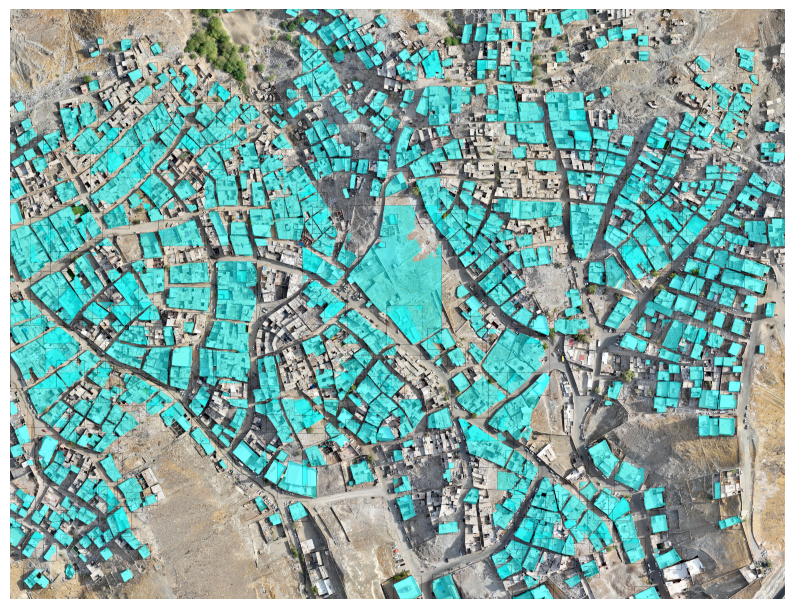

In [ ]:
# # Read the original image
image = cv2.imread("Untitled.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# # Load the auto-detection model
detection_model = AutoDetectionModel.from_pretrained(
    model_type="yolov8",
    model_path='buildings-flkennedy.pt',
    confidence_threshold=0.3,
    device="cuda:0"  # or 'cpu'
)

# Perform prediction
result = get_sliced_prediction(
    image,
    detection_model,
    slice_height=2300,
    slice_width=2300,
    overlap_height_ratio=0.3,
    overlap_width_ratio=0.3,
    postprocess_class_agnostic=True
)



# Check if any predictions are made
if not result.object_prediction_list:
    print("No objects detected in the image.")
else:
    building_count = 0
    # Draw bounding boxes and masks on the image
    for x, object_prediction in enumerate(result.object_prediction_list):
      if object_prediction.score.value < 0.4:
        continue

        # Draw bounding box
      building_count += 1
      cv2.rectangle(
          image,
          (object_prediction.bbox.minx, object_prediction.bbox.miny),
          (object_prediction.bbox.maxx, object_prediction.bbox.maxy),
          (0, 0, 0), 2
      )
        # Apply mask if available
      if hasattr(object_prediction, 'mask') and object_prediction.mask is not None:
          mask = object_prediction.mask.bool_mask
          # Ensure the mask is a boolean array
          if mask.dtype != bool:
              mask = mask.astype(bool)
          # Highlight the mask on the image
          image[mask] = (image[mask] * 0.5 + np.array([0, 255, 255]) * 0.5).astype(np.uint8)

# Display the image
print(f"Number of buildings detected: ({building_count})")
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis('off')
plt.show()


# Evaluating the small model for building segmentation by keremberke

Performing prediction on 391 slices.
Number of buildings detected: (571)


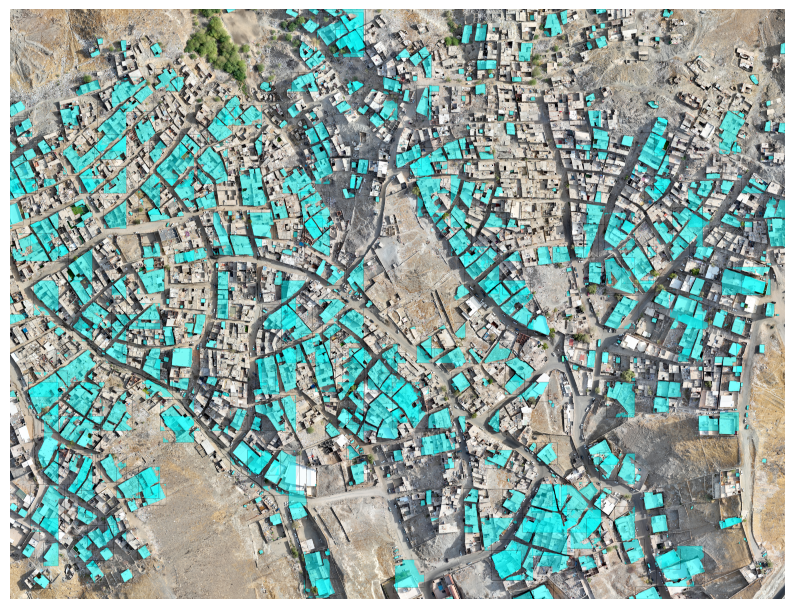

In [ ]:
# # Read the original image
image = cv2.imread("Untitled.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# # Load the auto-detection model
detection_model = AutoDetectionModel.from_pretrained(
    model_type="yolov8",
    model_path='buildings-keremberke.pt',
    confidence_threshold=0.3,
    device="cuda:0"  # or 'cpu'
)

# Perform prediction
result = get_sliced_prediction(
    image,
    detection_model,
    slice_height=800,
    slice_width=800,
    overlap_height_ratio=0.3,
    overlap_width_ratio=0.3,
    postprocess_class_agnostic=True
)



# Check if any predictions are made
if not result.object_prediction_list:
    print("No objects detected in the image.")
else:
    building_count = 0
    # Draw bounding boxes and masks on the image
    for x, object_prediction in enumerate(result.object_prediction_list):
      if object_prediction.score.value < 0.5:
        continue

        # Draw bounding box
      building_count += 1
      cv2.rectangle(
          image,
          (object_prediction.bbox.minx, object_prediction.bbox.miny),
          (object_prediction.bbox.maxx, object_prediction.bbox.maxy),
          (0, 0, 0), 2
      )
        # Apply mask if available
      if hasattr(object_prediction, 'mask') and object_prediction.mask is not None:
          mask = object_prediction.mask.bool_mask
          # Ensure the mask is a boolean array
          if mask.dtype != bool:
              mask = mask.astype(bool)
          # Highlight the mask on the image
          image[mask] = (image[mask] * 0.5 + np.array([0, 255, 255]) * 0.5).astype(np.uint8)

# Display the image
print(f"Number of buildings detected: ({building_count})")
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis('off')
plt.show()


# Evaluating the medium model for building segmentation by keremberke

Performing prediction on 20 slices.
Number of buildings detected: (9)


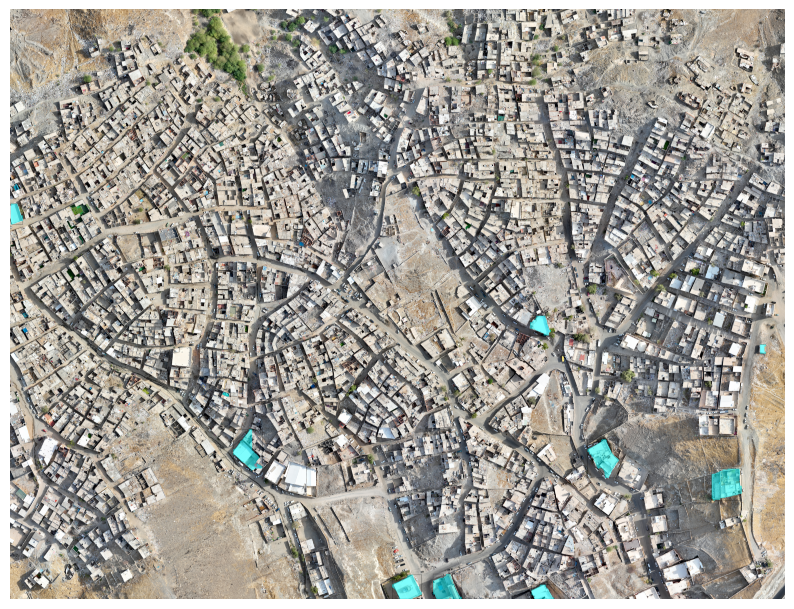

In [6]:
# # Read the original image
image = cv2.imread("Untitled.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# # Load the auto-detection model
detection_model = AutoDetectionModel.from_pretrained(
    model_type="yolov8",
    model_path='buildingm-keremberke.pt',
    confidence_threshold=0.3,
    device="cuda:0"  # or 'cpu'
)

# Perform prediction
result = get_sliced_prediction(
    image,
    detection_model,
    slice_height=4000,
    slice_width=4000,
    overlap_height_ratio=0.3,
    overlap_width_ratio=0.3,
    postprocess_class_agnostic=True
)



# Check if any predictions are made
if not result.object_prediction_list:
    print("No objects detected in the image.")
else:
    building_count = 0
    # Draw bounding boxes and masks on the image
    for x, object_prediction in enumerate(result.object_prediction_list):
      if object_prediction.score.value < 0.4:
        continue

        # Draw bounding box
      building_count += 1
      cv2.rectangle(
          image,
          (object_prediction.bbox.minx, object_prediction.bbox.miny),
          (object_prediction.bbox.maxx, object_prediction.bbox.maxy),
          (0, 0, 0), 2
      )
        # Apply mask if available
      if hasattr(object_prediction, 'mask') and object_prediction.mask is not None:
          mask = object_prediction.mask.bool_mask
          # Ensure the mask is a boolean array
          if mask.dtype != bool:
              mask = mask.astype(bool)
          # Highlight the mask on the image
          image[mask] = (image[mask] * 0.5 + np.array([0, 255, 255]) * 0.5).astype(np.uint8)

# Display the image
print(f"Number of buildings detected: ({building_count})")
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis('off')
plt.show()


# Evaluating Bruno64's building detection mode

Performing prediction on 2806 slices.
Number of buildings detected: (1197)


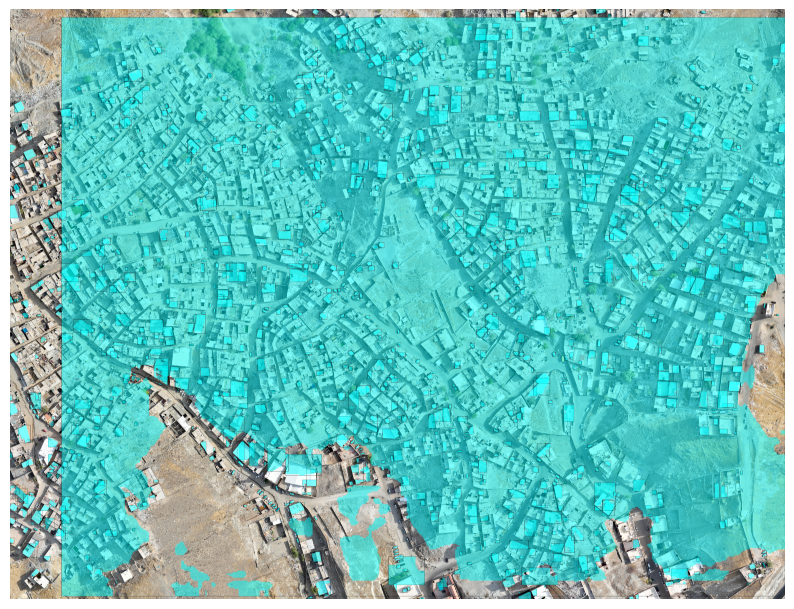

In [5]:
# # Read the original image
image = cv2.imread("Untitled.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# # Load the auto-detection model
detection_model = AutoDetectionModel.from_pretrained(
    model_type="yolov8",
    model_path='bruno.pt',
    confidence_threshold=0.3,
    device="cuda:0"  # or 'cpu'
)

# Perform prediction
result = get_sliced_prediction(
    image,
    detection_model,
    slice_height=300,
    slice_width=300,
    overlap_height_ratio=0.3,
    overlap_width_ratio=0.3,
    postprocess_class_agnostic=True
)



# Check if any predictions are made
if not result.object_prediction_list:
    print("No objects detected in the image.")
else:
    building_count = 0
    # Draw bounding boxes and masks on the image
    for x, object_prediction in enumerate(result.object_prediction_list):
      if object_prediction.score.value < 0.4:
        continue

        # Draw bounding box
      building_count += 1
      cv2.rectangle(
          image,
          (object_prediction.bbox.minx, object_prediction.bbox.miny),
          (object_prediction.bbox.maxx, object_prediction.bbox.maxy),
          (0, 0, 0), 2
      )
        # Apply mask if available
      if hasattr(object_prediction, 'mask') and object_prediction.mask is not None:
          mask = object_prediction.mask.bool_mask
          # Ensure the mask is a boolean array
          if mask.dtype != bool:
              mask = mask.astype(bool)
          # Highlight the mask on the image
          image[mask] = (image[mask] * 0.5 + np.array([0, 255, 255]) * 0.5).astype(np.uint8)

# Display the image
print(f"Number of buildings detected: ({building_count})")
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis('off')
plt.show()
